# Importing Libraries

In [1]:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import joblib
import numpy as np
import pandas as pd
import warnings

import matplotlib
import matplotlib.pyplot as plt
from matplotlib import ticker
import seaborn as sns

# setting up options
# pd.set_option('display.max_rows', None)
# pd.set_option('display.max_columns', None)
warnings.filterwarnings('ignore')

C:\Users\jang.b.singh.umath\Anaconda3\envs\Auto_MMM\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\jang.b.singh.umath\Anaconda3\envs\Auto_MMM\lib\site-packages\numpy\.libs\libopenblas.FB5AE2TYXYH2IJRDKGDGQ3XBKLKTF43H.gfortran-win_amd64.dll
C:\Users\jang.b.singh.umath\Anaconda3\envs\Auto_MMM\lib\site-packages\numpy\.libs\libopenblas.NOIJJG62EMASZI6NYURL6JBKM4EVBGM7.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


## Assumptions
1. Assuming that we have data for testing the hypothesis with below characteristics:
    - Sufficient Data: Sample shoould represent the population
    - Consistent Data: The result should follow simila trend for atleast 2-3 weeks
    - Differenriated Data: The lift should be above to natural variance in the data samples
    - Statisticak Confidence: Result should be have confidence of 90% or more(in general)
2. I am assuming that data shared is at transaction level. So, I am ignoring to perform any treatment on duplicate records(~6000 rows)

# Data Exploration and EDA

In [2]:
file_path = "./marketing_campaign_data/data.csv"
data = pd.read_csv(file_path)
df_model = data.copy()
df_model.dataframeName = 'Marketting Data'

There are ~6K duplicate rows. I am not excluding them

In [3]:
data[data.duplicated()]['conversion'].count()

6603

In [4]:
# Let's take a look at our data
df_model.head(5)

,recency,history,used_discount,used_bogo,zip_code,is_referral,channel,offer,conversion
0,10,142.44,1,0,Surburban,0,Phone,Buy One Get One,0
1,6,329.08,1,1,Rural,1,Web,No Offer,0
2,7,180.65,0,1,Surburban,1,Web,Buy One Get One,0
3,9,675.83,1,0,Rural,1,Web,Discount,0
4,2,45.34,1,0,Urban,0,Web,Buy One Get One,0


In [5]:
# Checking for null data
df_model.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64000 entries, 0 to 63999
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   recency        64000 non-null  int64  
 1   history        64000 non-null  float64
 2   used_discount  64000 non-null  int64  
 3   used_bogo      64000 non-null  int64  
 4   zip_code       64000 non-null  object 
 5   is_referral    64000 non-null  int64  
 6   channel        64000 non-null  object 
 7   offer          64000 non-null  object 
 8   conversion     64000 non-null  int64  
dtypes: float64(1), int64(5), object(3)
memory usage: 4.4+ MB


Good, there is no null data in this dataset

In [6]:
# Checking for object data
df_model.describe(include=np.object)

,zip_code,channel,offer
count,64000,64000,64000
unique,3,3,3
top,Surburban,Web,Buy One Get One
freq,28776,28217,21387


In [7]:
# Checking unique object data
object_cols = [col for col in df_model.columns if df_model[col].dtype == "object"]
for obj in object_cols:
    print('\n', obj)
    for unique in df_model[obj].unique():
        print("{} {}".format(unique,sum(df_model[obj] == unique)))


 zip_code
Surburban 28776
Rural 9563
Urban 25661

 channel
Phone 28021
Web 28217
Multichannel 7762

 offer
Buy One Get One 21387
No Offer 21306
Discount 21307


## Basic Exploratory Data Analysis

In [109]:
# Distribution graphs (histogram/bar graph) of column data
def plotPerColumnDistribution(df, nGraphShown, nGraphPerRow):
    nunique = df.nunique()
    df = df[[col for col in df if nunique[col] > 1 and nunique[col] < 50]] # For displaying purposes, pick columns that have between 1 and 50 unique values
    nRow, nCol = df.shape
    columnNames = list(df)
    nGraphRow = (nCol + nGraphPerRow - 1) / nGraphPerRow
    plt.figure(num = None, figsize = (6 * nGraphPerRow, 8 * nGraphRow), dpi = 80, facecolor = 'w', edgecolor = 'k')
    for i in range(min(nCol, nGraphShown)):
        plt.subplot(nGraphRow, nGraphPerRow, i + 1)
        columnDf = df.iloc[:, i]
        if (not np.issubdtype(type(columnDf.iloc[0]), np.number)):
            valueCounts = columnDf.value_counts()
            valueCounts.plot.bar()
        else:
            columnDf.hist()
        plt.ylabel('counts')
        plt.xticks(rotation = 90)
        plt.title(f'{columnNames[i]} (column {i})')
    plt.tight_layout(pad = 1.0, w_pad = 1.0, h_pad = 1.0)
    plt.show()


In [110]:
# Correlation matrix
def plotCorrelationMatrix(df, graphWidth):
    filename = df.dataframeName
    df = df.dropna('columns') # drop columns with NaN
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    if df.shape[1] < 2:
        print(f'No correlation plots shown: The number of non-NaN or constant columns ({df.shape[1]}) is less than 2')
        return
    corr = df.corr()
    plt.figure(num=None, figsize=(graphWidth, graphWidth), dpi=80, facecolor='w', edgecolor='k')
    corrMat = plt.matshow(corr, fignum = 1)
    plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
    plt.yticks(range(len(corr.columns)), corr.columns)
    plt.gca().xaxis.tick_bottom()
    plt.colorbar(corrMat)
    plt.title(f'Correlation Matrix for {filename}', fontsize=15)
    plt.show()


In [111]:
# Scatter and density plots
def plotScatterMatrix(df, plotSize, textSize):
    df = df.select_dtypes(include =[np.number]) # keep only numerical columns
    # Remove rows and columns that would lead to df being singular
    df = df.dropna('columns')
    df = df[[col for col in df if df[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    columnNames = list(df)
    if len(columnNames) > 10: # reduce the number of columns for matrix inversion of kernel density plots
        columnNames = columnNames[:10]
    df = df[columnNames]
    ax = pd.plotting.scatter_matrix(df, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate('Corr. coef = %.3f' % corrs[i, j], (0.8, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize)
    plt.suptitle('Scatter and Density Plot')
    plt.show()


### Distribution Plots

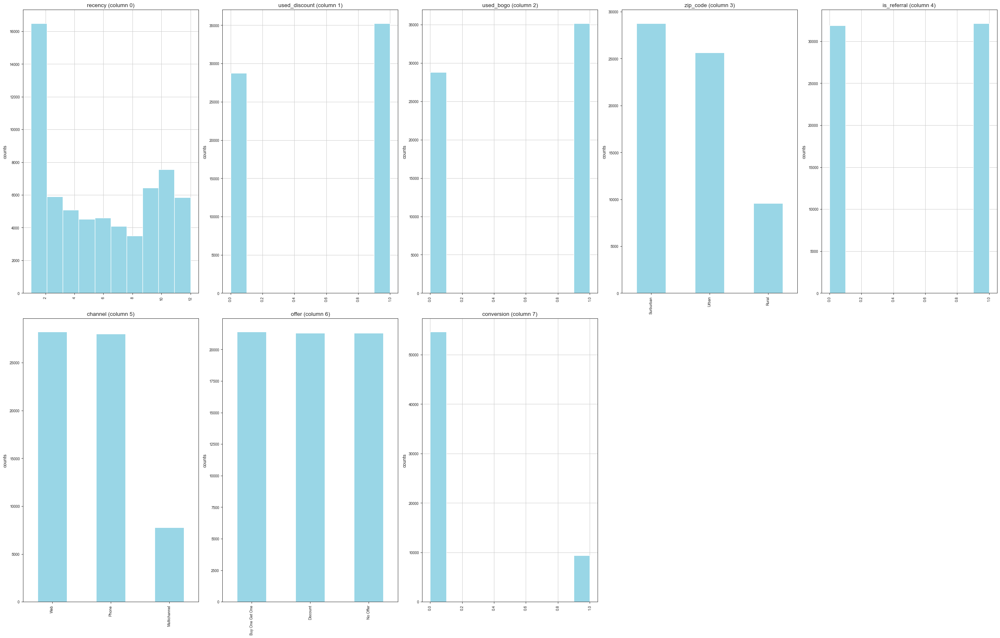

In [112]:
plotPerColumnDistribution(df_model, 10, 5)

In [113]:
cat_features = [col for col in df_model.columns if df_model[col].dtype == 'object']

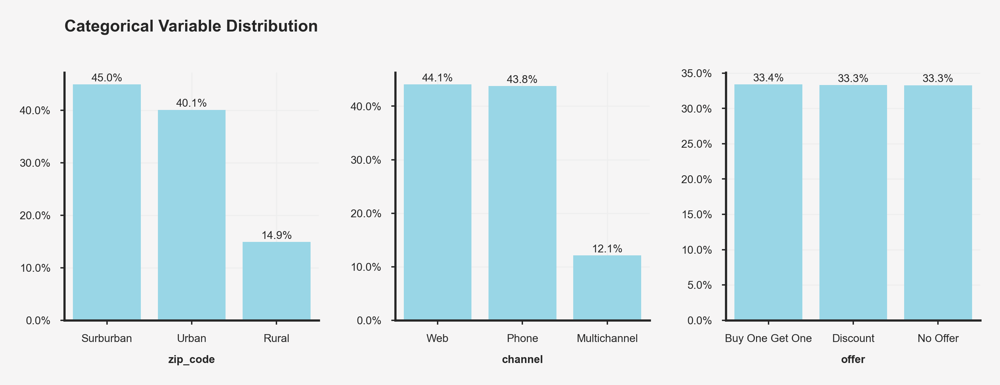

In [114]:
plt.rcParams['figure.dpi'] = 600
fig = plt.figure(figsize=(6, 6), facecolor='#f6f5f5')
gs = fig.add_gridspec(3, 3)
gs.update(wspace=0.3, hspace=0.3)

background_color = "#f6f5f5"
sns.set_palette(['#99d6e6']*3)

run_no = 0
for row in range(0, 1):
    for col in range(0, 3):
        locals()["ax"+str(run_no)] = fig.add_subplot(gs[row, col])
        locals()["ax"+str(run_no)].set_facecolor(background_color)
        for s in ["top","right"]:
            locals()["ax"+str(run_no)].spines[s].set_visible(False)
        run_no += 1

ax0.text(-0.5, 55, 'Categorical Variable Distribution', fontsize=6, fontweight='bold')
# ax0.text(-0.5, 60, 'features_25 - features_49', fontsize=6, fontweight='light')        

run_no = 0
for col in cat_features:
    temp_df = pd.DataFrame(df_model[col].value_counts())
    temp_df = temp_df.reset_index(drop=False)
    temp_df.columns = ['Number', 'Count']
    sns.barplot(ax=locals()["ax"+str(run_no)],x=temp_df['Number'], y=temp_df['Count']/len(df_model)*100, zorder=2, linewidth=0, alpha=1, saturation=1)
    locals()["ax"+str(run_no)].grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
    locals()["ax"+str(run_no)].grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
    locals()["ax"+str(run_no)].set_ylabel('')
    locals()["ax"+str(run_no)].set_xlabel(col, fontsize=4, fontweight='bold')
    locals()["ax"+str(run_no)].tick_params(labelsize=4, width=0.5, length=1.5)
    locals()["ax"+str(run_no)].yaxis.set_major_formatter(ticker.PercentFormatter())
    # data label
    for p in locals()["ax"+str(run_no)].patches:
        percentage = f'{p.get_height():.1f}%\n'
        x = p.get_x() + p.get_width() / 2
        y = p.get_height()
        locals()["ax"+str(run_no)].text(x, y, percentage, ha='center', va='center', fontsize=4)

    run_no += 1

plt.show()

### Correlation Matrix

<B>Key Insights </B>   
    - used_bogo and used_discount are negatively correlated<br>
    - history is negatively correlated with recency<br>
    - history and is_referral is slightly positively correlated<br>

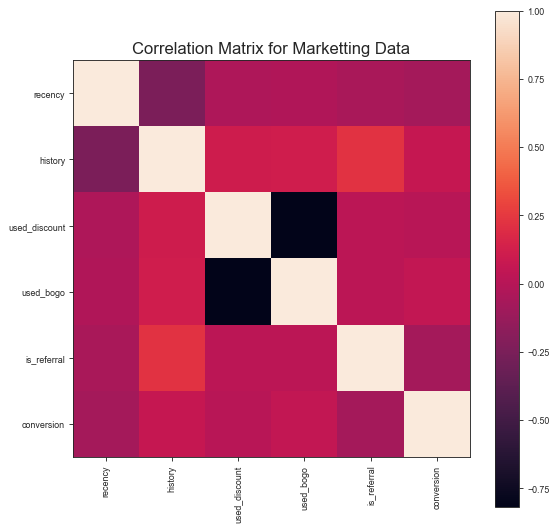

In [115]:
plotCorrelationMatrix(df_model, 8)

### Scatter and density plots

In [116]:
plotScatterMatrix(df_model, 18, 10)

There are 64000 potential clients, out of which 9394 became customers, a fact that we'll need to take into consideration when making the train and test split.

In [8]:
df_model['conversion'].value_counts()

0    54606
1     9394
Name: conversion, dtype: int64

In [9]:
df_model['offer'][df_model['conversion'] == 1].value_counts()

Discount           3894
Buy One Get One    3238
No Offer           2262
Name: offer, dtype: int64

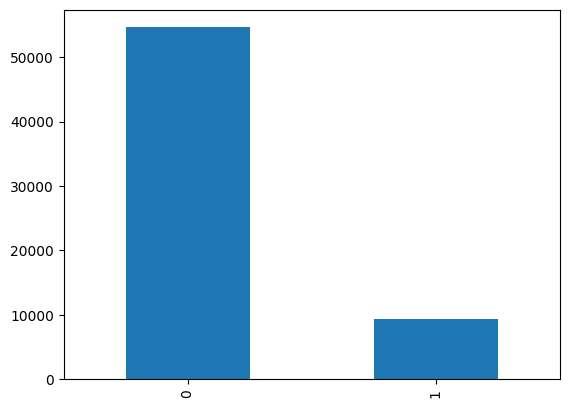

In [10]:
df_model['conversion'].value_counts().plot(kind='bar')
plt.show()

There are two categorical variables, zip_code that splits the location of the customer into Urban/Suburban/Rural, and the channel used to contact the client: Web/Phone/Multichannel. Let's see how different these components are between clients that purchased the item and those who didn't:

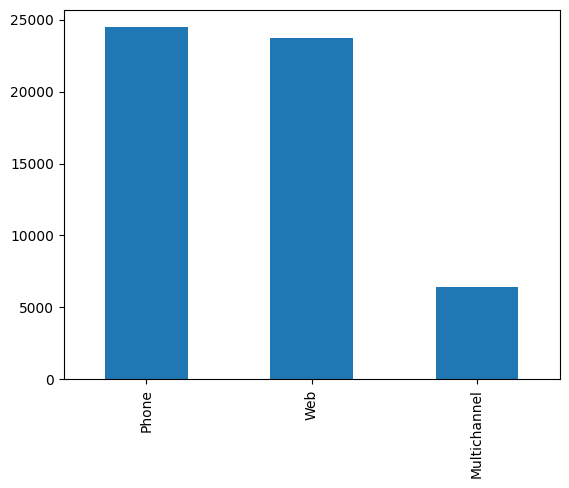

In [11]:
df_model['channel'][df_model['conversion'] == 0].value_counts().plot(kind='bar')
plt.show()

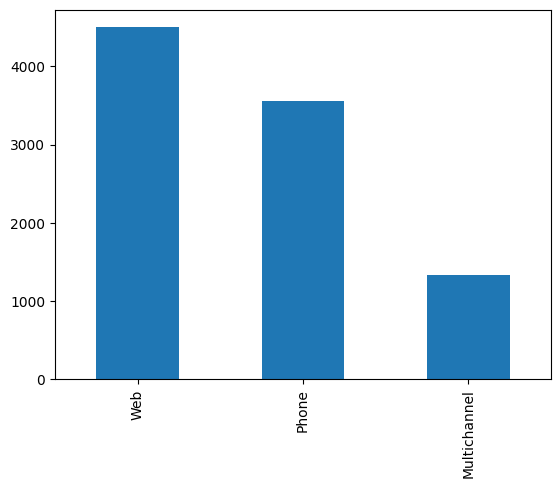

In [12]:
df_model['channel'][df_model['conversion'] == 1].value_counts().plot(kind='bar')
plt.show()

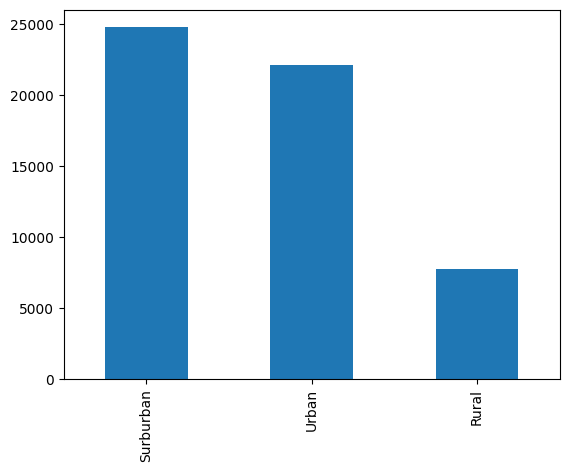

In [13]:
df_model['zip_code'][df_model['conversion'] == 0].value_counts().plot(kind='bar')
plt.show()

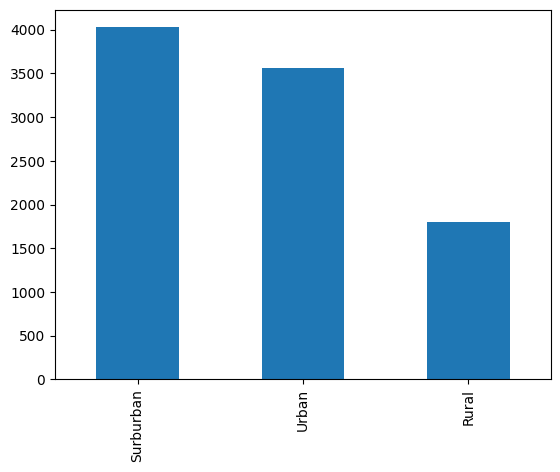

In [14]:
df_model['zip_code'][df_model['conversion'] == 1].value_counts().plot(kind='bar')
plt.show()

## Automate EDA report creation
In the lifecycle of a data science project or any machine learning project, more than 60% of your time goes into stuff like data analysis, feature selection, feature engineering, etc. Because it is the most important part or backbone of a data science project is that particular part itself where you have to a lot of activities like cleaning the data, handling missing values, handle outliers, handle imbalanced datasets, how to handle categorical features, and many more. So if you want to save your time in exploratory data analysis then we can use python libraries like dtale, dataprep, pandas profiling, sweetviz, and autoviz to automate our tasks. I am using dtale and sweetviz to perform automated EDA files

In [15]:
# !pip install dataprep

  0%|                                                                                         | 0/1049 [00:00<…

DataPrep Report
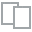
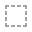
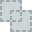
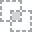
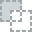
...
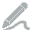
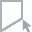
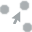
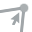
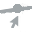

In [125]:
from dataprep.eda import create_report
create_report(data)

In [126]:
import sweetviz as sv

#EDA using Autoviz
sweet_report = sv.analyze(data)

#Saving results to HTML file
sweet_report.show_html('sweet_report.html')

                                             |                                             | [  0%]   00:00 ->…

Report sweet_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [127]:
df_model

,recency,history,used_discount,used_bogo,zip_code,is_referral,channel,offer,conversion
0,10,142.44,1,0,Surburban,0,Phone,Buy One Get One,0
1,6,329.08,1,1,Rural,1,Web,No Offer,0
2,7,180.65,0,1,Surburban,1,Web,Buy One Get One,0
3,9,675.83,1,0,Rural,1,Web,Discount,0
4,2,45.34,1,0,Urban,0,Web,Buy One Get One,0
...,...,...,...,...,...,...,...,...,...
63995,10,105.54,1,0,Urban,0,Web,Discount,0
63996,5,38.91,0,1,Urban,1,Phone,Discount,0
63997,6,29.99,1,0,Urban,1,Phone,Discount,0
63998,1,552.94,1,0,Surburban,1,Multichannel,Buy One Get One,0


## Data Preprocessing

In [16]:
# Rename target column
df_model = df_model.rename(columns={'conversion': 'target'})
# Rename & Label encode treatment column
df_model = df_model.rename(columns={'offer': 'treatment'})
df_model.treatment = df_model.treatment.map({'No Offer': 0, 'Buy One Get One': -1, 'Discount': 1})

In [17]:
df_model.treatment.value_counts()

-1    21387
 1    21307
 0    21306
Name: treatment, dtype: int64

In [18]:
df_model.target.value_counts()

0    54606
1     9394
Name: target, dtype: int64

In [19]:
df_model.head()

,recency,history,used_discount,used_bogo,zip_code,is_referral,channel,treatment,target
0,10,142.44,1,0,Surburban,0,Phone,-1,0
1,6,329.08,1,1,Rural,1,Web,0,0
2,7,180.65,0,1,Surburban,1,Web,-1,0
3,9,675.83,1,0,Rural,1,Web,1,0
4,2,45.34,1,0,Urban,0,Web,-1,0


In [20]:
# One-Hot Encoding:
df_model = pd.get_dummies(df_model)

In [21]:
df_model.head()

,recency,history,used_discount,used_bogo,is_referral,treatment,target,zip_code_Rural,zip_code_Surburban,zip_code_Urban,channel_Multichannel,channel_Phone,channel_Web
0,10,142.44,1,0,0,-1,0,0,1,0,0,1,0
1,6,329.08,1,1,1,0,0,1,0,0,0,0,1
2,7,180.65,0,1,1,-1,0,0,1,0,0,0,1
3,9,675.83,1,0,1,1,0,1,0,0,0,0,1
4,2,45.34,1,0,0,-1,0,0,0,1,0,0,1


In [22]:
df_model.mean()

recency                   5.763734
history                 242.085656
used_discount             0.551031
used_bogo                 0.549719
is_referral               0.502250
treatment                -0.001250
target                    0.146781
zip_code_Rural            0.149422
zip_code_Surburban        0.449625
zip_code_Urban            0.400953
channel_Multichannel      0.121281
channel_Phone             0.437828
channel_Web               0.440891
dtype: float64

In [23]:
df_model_bogo = df_model[df_model.treatment <= 0] # include no offer, bogo
df_model_discount = df_model[df_model.treatment >= 0] # include no offer, discount

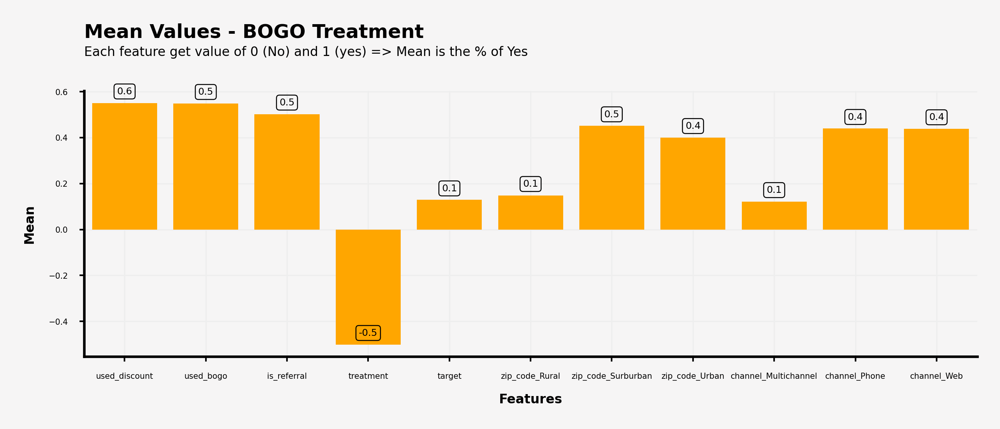

In [24]:
temp_df = df_model_bogo.mean()
temp_df = temp_df.reset_index(drop=False)
temp_df.columns = ['Features', 'Mean']
temp_df = temp_df.iloc[2:,:]
#temp_df = temp_df.sort_values('Mean', ascending=False)

plt.rcParams['figure.dpi'] = 600
fig = plt.figure(figsize=(5, 1.5), facecolor='#f6f5f5')
gs = fig.add_gridspec(1, 1)
gs.update(wspace=0.4, hspace=0.1)

background_color = "#f6f5f5"
sns.set_palette(['#ffa600']*11)

ax = fig.add_subplot(gs[0, 0])
for s in ["right", "top"]:
    ax.spines[s].set_visible(False)
ax.set_facecolor(background_color)
ax_sns = sns.barplot(ax=ax, x=temp_df['Features'], 
                      y=temp_df['Mean'], 
                      zorder=2, linewidth=0, alpha=1, saturation=1)
ax_sns.set_xlabel("Features",fontsize=4, weight='bold')
ax_sns.set_ylabel("Mean",fontsize=4, weight='bold')
ax_sns.grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
ax_sns.grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
ax_sns.tick_params(labelsize=2.5, width=0.5, length=1.5)
ax.text(-0.5, 0.9, 'Mean Values - BOGO Treatment', fontsize=6, ha='left', va='top', weight='bold')
ax.text(-0.5, 0.8, 'Each feature get value of 0 (No) and 1 (yes) => Mean is the % of Yes', fontsize=4, ha='left', va='top')
# data label
for p in ax.patches:
    percentage = f'{p.get_height():.1f}' ##{:. 0%}
    x = p.get_x() + p.get_width() / 2
    y = p.get_height() + 0.05
    ax.text(x, y, percentage, ha='center', va='center', fontsize=3,
           bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.3))

plt.show()

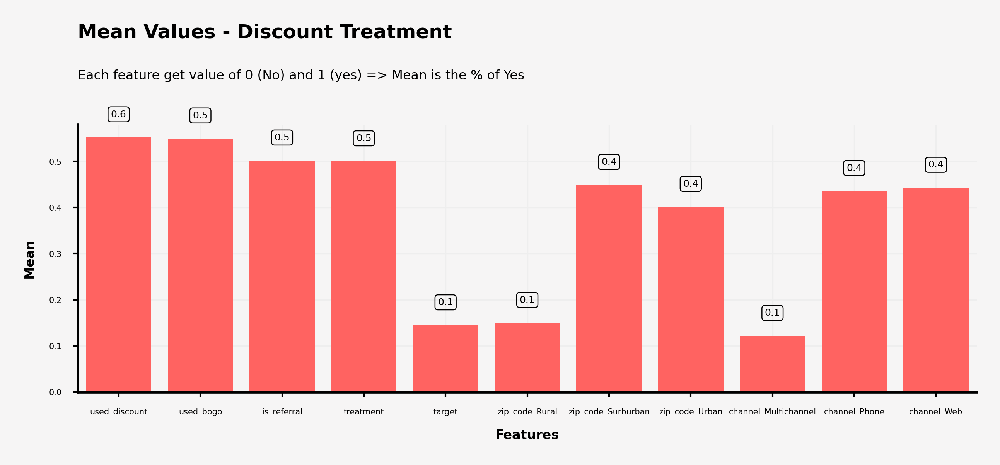

In [25]:
temp_df = df_model_discount.mean()
temp_df = temp_df.reset_index(drop=False)
temp_df.columns = ['Features', 'Mean']
temp_df = temp_df.iloc[2:,:]
#temp_df = temp_df.sort_values('Mean', ascending=False)

plt.rcParams['figure.dpi'] = 600
fig = plt.figure(figsize=(5, 1.5), facecolor='#f6f5f5')
gs = fig.add_gridspec(1, 1)
gs.update(wspace=0.4, hspace=0.1)

background_color = "#f6f5f5"
sns.set_palette(['#ff6361']*11)

ax = fig.add_subplot(gs[0, 0])
for s in ["right", "top"]:
    ax.spines[s].set_visible(False)
ax.set_facecolor(background_color)
ax_sns = sns.barplot(ax=ax, x=temp_df['Features'], 
                      y=temp_df['Mean'], 
                      zorder=2, linewidth=0, alpha=1, saturation=1)
ax_sns.set_xlabel("Features",fontsize=4, weight='bold')
ax_sns.set_ylabel("Mean",fontsize=4, weight='bold')
ax_sns.grid(which='major', axis='x', zorder=0, color='#EEEEEE', linewidth=0.4)
ax_sns.grid(which='major', axis='y', zorder=0, color='#EEEEEE', linewidth=0.4)
ax_sns.tick_params(labelsize=2.5, width=0.5, length=1.5)
ax.text(-0.5, 0.8, 'Mean Values - Discount Treatment', fontsize=6, ha='left', va='top', weight='bold')
ax.text(-0.5, 0.7, 'Each feature get value of 0 (No) and 1 (yes) => Mean is the % of Yes', fontsize=4, ha='left', va='top')
# data label
for p in ax.patches:
    percentage = f'{p.get_height():.1f}' ##{:. 0%}
    x = p.get_x() + p.get_width() / 2
    y = p.get_height() + 0.05
    ax.text(x, y, percentage, ha='center', va='center', fontsize=3,
           bbox=dict(facecolor='none', edgecolor='black', boxstyle='round', linewidth=0.3))

plt.show()

# Uplift Modeling to predict and target the right customers
![](https://st2.ning.com/topology/rest/1.0/file/get/2220280883?profile=original)
[Uplift modelling](https://en.wikipedia.org/wiki/Uplift_modelling), also known as incremental modelling, true lift modelling, or net modelling is a predictive modelling technique that directly models the incremental impact of a treatment (such as a direct marketing action) on an individual's behaviour.

# Target Class Declaration (y)
`{Control x Treatment} x {Responde / No Response} = Treament{0, -1 or 1} x Target{0, 1}`
> **Control Non-Responders** (CN): don't make a purchase without an offer => value = 0

> **Control Responders** (CR): make a purchase without an offer => value = 1

> **Treatment Non-Responders** (TN): don't make a purchase even with an offer => value = 2

> **Treatment Responders** (TR): make a purchase and receive an offer (value = 3) 


In [26]:
# Function to declare Target Class
def declare_tc(df:pd.DataFrame):
    df['target_class'] = 0 # CN
    df.loc[(df.treatment == 0) & (df.target != 0),'target_class'] = 1 # CR
    df.loc[(df.treatment != 0) & (df.target == 0),'target_class'] = 2 # TN
    df.loc[(df.treatment != 0) & (df.target != 0),'target_class'] = 3 # TR
    return df

In [27]:
# run the functions for each treatment
df_model_bogo = declare_tc(df_model_bogo)
df_model_discount = declare_tc(df_model_discount)

In [30]:
df_model_bogo['target_class'].value_counts()

0    19044
2    18149
3     3238
1     2262
Name: target_class, dtype: int64

In [31]:
df_model_discount['target_class'].value_counts()

0    19044
2    17413
3     3894
1     2262
Name: target_class, dtype: int64

# Uplift Modeling: y = f(X)
* TR = Sure Things + Persuadable (=> Positive effect)
* TN = Lost Causes + Sleeping Dogs (=> Negative effect)
* CN = Persuadables + Lost Causes (=> Positive effect)
* CR = Sure Things + Sleeping Dogs (=> Negative effect)

> Uplift Score = P(CN | C) + P(TR | T) - P(TN | T) - P(CR | C)

*Tips: To keep it easy to under stand*
* (+) for positive effect
* (-) for negative effect

> Uplift Score = P(CN)/P(C) + P(TR)/P(T) - P(TN)/P(T) - P(CR)/P(C)

In [32]:
# Functions for Uplift
from sklearn.model_selection import train_test_split
import xgboost as xgb
def uplift_split(df_model:pd.DataFrame):
    ## 1 - Train-Test Split
    X = df_model.drop(['target','target_class'],axis=1)
    y = df_model.target_class
    X_train, X_test, y_train, y_test  = train_test_split(X, y,
                                       test_size=0.3,
                                       random_state=42,
                                       stratify=df_model['treatment'])
    return X_train,X_test, y_train, y_test


def uplift_model(X_train:pd.DataFrame,
                 X_test:pd.DataFrame,
                 y_train:pd.DataFrame,
                 y_test:pd.DataFrame):
    ## 2 - Using XGB to get the uplift score
    # Create new dataframe
    result = pd.DataFrame(X_test).copy()    
    # Fit the model
    uplift_model = xgb.XGBClassifier().fit(X_train.drop('treatment', axis=1), y_train)
    
    
    # Predict using test-data
    uplift_proba = uplift_model.predict_proba(X_test.drop('treatment', axis=1))
    result['proba_CN'] = uplift_proba[:,0] 
    result['proba_CR'] = uplift_proba[:,1] 
    result['proba_TN'] = uplift_proba[:,2] 
    result['proba_TR'] = uplift_proba[:,3]
    result['uplift_score'] = result.eval('\
    proba_CN/(proba_CN+proba_CR) \
    + proba_TR/(proba_TN+proba_TR) \
    - proba_TN/(proba_TN+proba_TR) \
    - proba_CR/(proba_CN+proba_CR)')  
    # Put the result 
    result['target_class'] = y_test
    return result


def uplift(df_model:pd.DataFrame):
    # Combine the split and Modeling function
    X_train, X_test, y_train, y_test = uplift_split(df_model)
    result = uplift_model(X_train, X_test, y_train, y_test)
    return result

In [33]:
# Run the uplift function
bogo_uplift = uplift(df_model_bogo)
discount_uplift = uplift(df_model_discount)

[10:07:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[10:07:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [34]:
bogo_uplift.head()

,recency,history,used_discount,used_bogo,is_referral,treatment,zip_code_Rural,zip_code_Surburban,zip_code_Urban,channel_Multichannel,channel_Phone,channel_Web,proba_CN,proba_CR,proba_TN,proba_TR,uplift_score,target_class
31024,10,211.48,1,0,0,0,0,1,0,1,0,0,0.623754,0.057602,0.273621,0.045023,0.113510,1
10728,10,140.50,1,0,0,-1,0,0,1,0,1,0,0.511970,0.019497,0.440900,0.027633,0.044586,2
9555,4,76.25,1,0,0,-1,0,1,0,0,1,0,0.468098,0.090066,0.381348,0.060488,-0.048920,2
48906,5,29.99,0,1,0,-1,1,0,0,0,1,0,0.461972,0.092152,0.331452,0.114424,0.180654,2
36219,9,248.28,1,0,0,-1,0,1,0,0,0,1,0.512261,0.076322,0.368803,0.042614,-0.052184,3


In [38]:
# bogo_uplift[bogo_uplift['target_class'] == 3]['uplift_score'].mean()
bogo_uplift.groupby('target_class').mean()[['uplift_score']].reset_index()

,target_class,uplift_score
0,0,0.089049
1,1,0.073073
2,2,0.085038
3,3,0.109617


In [39]:

discount_uplift.groupby('target_class').mean()[['uplift_score']].reset_index()

,target_class,uplift_score
0,0,0.151601
1,1,0.160390
2,2,0.153167
3,3,0.165909


## Evaluation: Segmentation
* BOGO Segmentation

In [40]:
seg_df = data.merge(bogo_uplift.iloc[:,-6:], left_index=True, right_index=True)
seg_df['target'] = 0
seg_df['target'][seg_df.offer != 'No Offer'] = 1
# seg_df['uplift_score'] = seg_df['uplift_score'].apply(lambda x: round(x, 2))
# score = list(lambda x : round(x,2) seg_df['uplift_score'])
# seg_df['uplift1'] = score
# seg_df.uplift_score = seg_df.uplift_score.round(2)
seg_df['uplift_score'] = seg_df['uplift_score']*100
seg_df.rename(columns = {'uplift_score' : 'uplift %'}, inplace=True)


In [60]:
# seg_df

* Uplift Effect of BOGO is stronger in Urban area & Web channel (but the difference is not significant)

In [42]:
seg_df.groupby(['zip_code', 'target']).mean()[['uplift %']].reset_index()

,zip_code,target,uplift %
0,Rural,0,8.342192
1,Rural,1,8.690866
2,Surburban,0,8.403244
3,Surburban,1,8.712647
4,Urban,0,9.276971
5,Urban,1,9.126719


In [43]:
seg_df.groupby(['channel', 'target']).mean()[['uplift %']].reset_index()

,channel,target,uplift %
0,Multichannel,0,9.036827
1,Multichannel,1,8.075944
2,Phone,0,8.101027
3,Phone,1,8.616971
4,Web,0,9.297622
5,Web,1,9.358504


In [47]:
seg_df.groupby(['is_referral', 'target']).mean()[['uplift %']].reset_index()

,is_referral,target,uplift %
0,0,0,7.350529
1,0,1,7.561236
2,1,0,10.080919
3,1,1,10.182920


In [48]:
seg_df.groupby(['recency', 'target']).mean()[['uplift %']].reset_index()

,recency,target,uplift %
0,1,0,7.049831
1,1,1,7.192208
2,2,0,8.651134
3,2,1,9.902472
4,3,0,7.169655
5,3,1,8.291447
6,4,0,7.483758
7,4,1,8.692756
8,5,0,9.967382
9,5,1,9.543875


* For users who already uses the Discount offer before, the uplift effect of BOGO is minimal => Cancel-out effect between 2 approaches
* For users who are familiar with BOGO before, the uplift effect is stronger

In [65]:
seg_df.groupby('used_discount').mean()[['target','uplift %']].reset_index()

,used_discount,target,uplift %
0,0,0.508291,14.114808
1,1,0.494985,4.512915


In [66]:
seg_df.groupby('used_bogo').mean()[['target','uplift %']].reset_index()

,used_bogo,target,uplift %
0,0,0.494173,2.339888
1,1,0.506446,14.075456


In [68]:
seg_df.groupby(['used_bogo', 'is_referral']).mean()[['target','uplift %']].reset_index()

,used_bogo,is_referral,target,uplift %
0,0,0,0.497617,0.333403
1,0,1,0.490573,4.437026
2,1,0,0.510732,13.610560
3,1,1,0.502460,14.507688


## Evaluation: Segmentation
* Discount Segmentation

In [69]:
seg_df = data.merge(discount_uplift.iloc[:,-6:], left_index=True, right_index=True)
seg_df['target'] = 0
seg_df['target'][seg_df.offer != 'No Offer'] = 1
# seg_df['uplift_score'] = seg_df['uplift_score'].apply(lambda x: round(x, 2))
# score = list(lambda x : round(x,2) seg_df['uplift_score'])
# seg_df['uplift1'] = score
# seg_df.uplift_score = seg_df.uplift_score.round(2)
seg_df['uplift_score'] = seg_df['uplift_score']*100
seg_df.rename(columns = {'uplift_score' : 'uplift %'}, inplace=True)


* Uplift Effect of Discount is stronger in Urban area(Not Significant difference) & Multi channel (Significant difference)

In [70]:
seg_df.groupby('zip_code').mean()[['target','uplift %']].reset_index()

,zip_code,target,uplift %
0,Rural,0.513019,15.546285
1,Surburban,0.497594,14.629312
2,Urban,0.498159,16.227087


In [71]:
seg_df.groupby('channel').mean()[['target','uplift %']].reset_index()

,channel,target,uplift %
0,Multichannel,0.505754,19.354494
1,Phone,0.486871,15.271079
2,Web,0.511307,14.442533


In [72]:
seg_df.groupby('is_referral').mean()[['target','uplift %']].reset_index()

,is_referral,target,uplift %
0,0,0.500544,15.795943
1,1,0.499449,15.006872


* For users who already uses the Discount offer before, the uplift effect of Discount is not significant 
* For users who are familiar with BOGO before, the uplift effect of Disocunt is not significant

In [73]:
seg_df.groupby('used_discount').mean()[['target','uplift %']].reset_index()

,used_discount,target,uplift %
0,0,0.498525,14.49265
1,1,0.501211,16.15172


In [74]:
seg_df.groupby('used_bogo').mean()[['target','uplift %']].reset_index()

,used_bogo,target,uplift %
0,0,0.497390,14.031194
1,1,0.502132,16.525166


# Evaluation - QINI Curve
Qini is a generalization of gini curve for Uplift model, introduced by [Radcliffe](https://www.google.com/url?sa=t&rct=j&q=&esrc=s&source=web&cd=1&cad=rja&uact=8&ved=2ahUKEwj_lZbfkNHoAhU_8XMBHYMBBUAQFjAAegQICBAC&url=https%3A%2F%2Fwww.semanticscholar.org%2Fpaper%2FUsing-control-groups-to-target-on-predicted-lift%253A-Radcliffe%2F147b32f3d56566c8654a9999c5477dded233328e&usg=AOvVaw3FuLoBYIejr_plj6oAE27o). The QINI (Uplift value) can be calculated as: 
> **QINI = TR - [(CR*T)/C]**

Thus can be normalized in percentage as: 
> **QINI = (TR/T) - (CR/C)**

In [50]:
# Functions to build the Uplift model and visualize the QINI Curve
def qini_rank(uplift:pd.DataFrame):
    """Rank the data by the uplift score
    """
    # Creat new dataframe
    ranked = pd.DataFrame({'n':[], 'target_class':[]})
    ranked['target_class'] = uplift['target_class']
    ranked['uplift_score'] = uplift['uplift_score']
    
    
    # Add proportion
    ranked['n'] = ranked.uplift_score.rank(pct=True, ascending=False)
    # Data Ranking   
    ranked = ranked.sort_values(by='n').reset_index(drop=True)
    return ranked


def qini_eval(ranked:pd.DataFrame):
    """Evaluate the uplift value with the QINI criterion
    """
    uplift_model, random_model = ranked.copy(), ranked.copy()
    # Using Treatment and Control Group to calculate the uplift (Incremental gain)
    C, T = sum(ranked['target_class'] <= 1), sum(ranked['target_class'] >= 2)
    ranked['cr'] = 0
    ranked['tr'] = 0
    ranked.loc[ranked.target_class == 1,'cr'] = 1
    ranked.loc[ranked.target_class == 3,'tr'] = 1
    ranked['cr/c'] = ranked.cr.cumsum() / C
    ranked['tr/t'] = ranked.tr.cumsum() / T
    # Calculate and put the uplift and random value into dataframe
    uplift_model['uplift'] = round(ranked['tr/t'] - ranked['cr/c'],5)
    random_model['uplift'] = round(ranked['n'] * uplift_model['uplift'].iloc[-1],5)
    
    
    # Add q0
    q0 = pd.DataFrame({'n':0, 'uplift':0, 'target_class': None}, index =[0])
    uplift_model = pd.concat([q0, uplift_model]).reset_index(drop = True)
    random_model = pd.concat([q0, random_model]).reset_index(drop = True)  
    # Add model name & concat
    uplift_model['model'] = 'Uplift model'
    random_model['model'] = 'Random model'
    merged = pd.concat([uplift_model, random_model]).sort_values(by='n').reset_index(drop = True)
    return merged


def qini_plot(merged:pd.DataFrame):
    """Plot the QINI
    """
    # plot the data
    ax = sns.lineplot(x='n', y='uplift', hue='model', data=merged,
                      style='model', palette=['red','grey'])
    
    
    # Plot settings
    sns.set_style('ticks')
    handles, labels = ax.get_legend_handles_labels()
    plt.xlabel('Proportion targeted',fontsize=5)
    plt.ylabel('Uplift',fontsize=5)
    plt.subplots_adjust(right=1)
    plt.subplots_adjust(top=1)
    plt.legend(fontsize=5)
    ax.tick_params(labelsize=5)
    ax.legend(handles=handles[1:], labels=labels[1:], loc='upper right')
    return ax


def qini(uplift:pd.DataFrame):
    """Combine all functions
    """
    ranked = qini_rank(uplift)
    merged = qini_eval(ranked)
    ax = qini_plot(merged)
    return ax

# Result
The QINI curve as shown below visualize the performance of Uplift model in targeting the right customers from the test-data.
The results show that the Uplift model can give more uplift than random model (without model).

As confirmed by Qini curve in below charts, BOGO offer is showing good treatment as compared to Discount offer. 

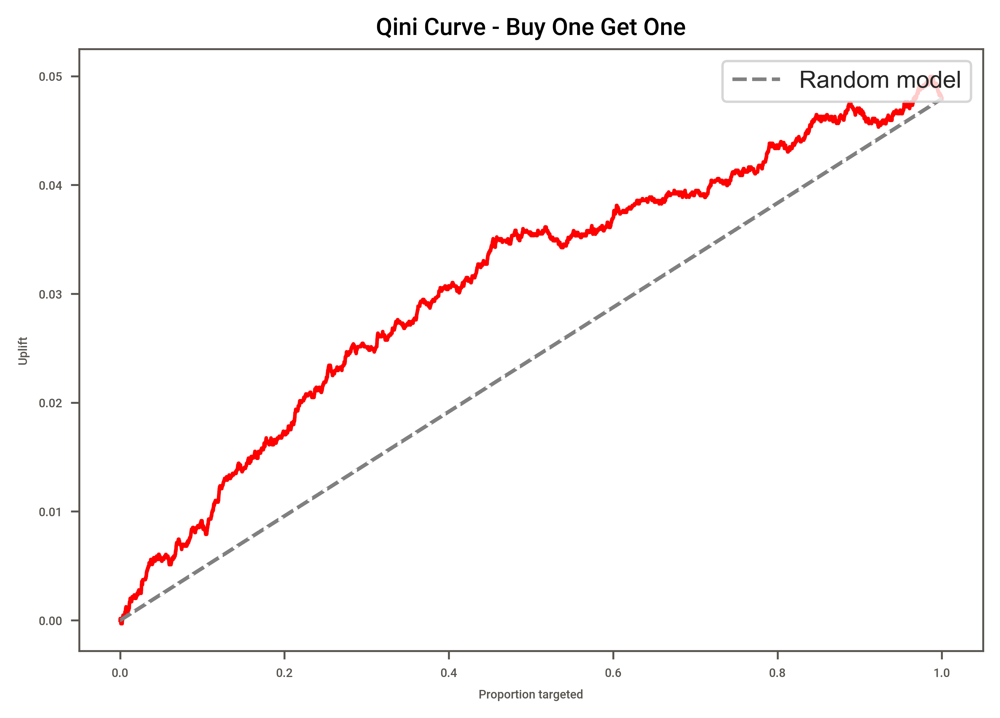

In [76]:
# plot the Qini curve for BOGO treatment
qini(bogo_uplift)
plt.title('Qini Curve - Buy One Get One',fontsize=10)
plt.show()

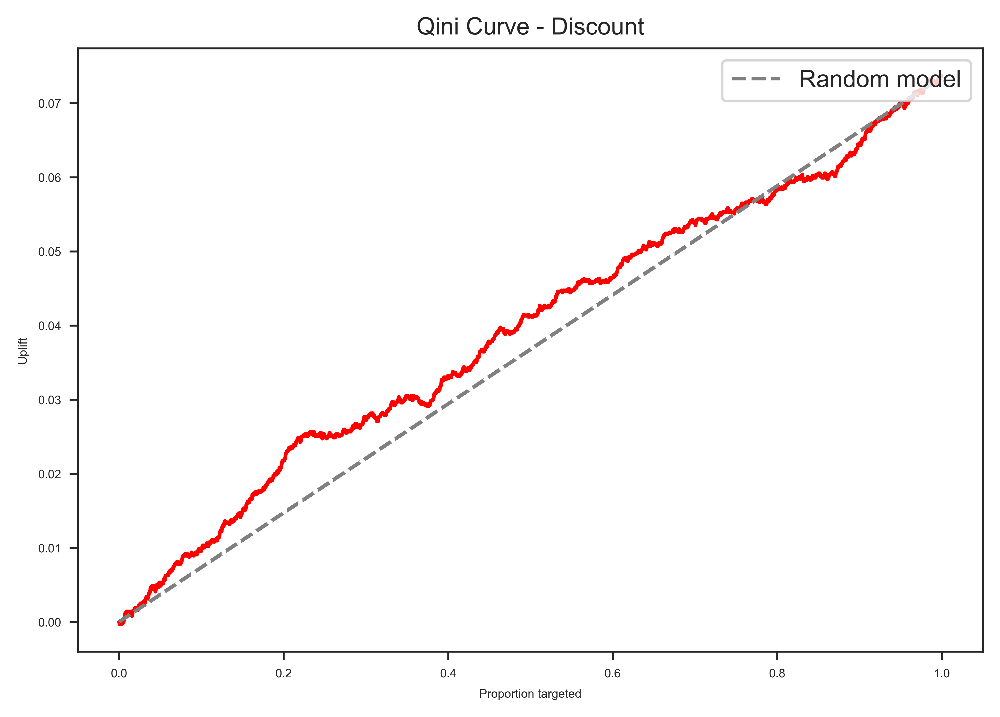

In [77]:
# plot the Qini curve for Discount treatment
qini(discount_uplift)
plt.title('Qini Curve - Discount',fontsize=10)
plt.show()